# Introduction to zero-shot image classification using CLIP

This file will go through each of the steps required to create and evaluate a zero-shot classification model for objects in visuals.

A few notes on terminology:
- A classifier takes some data and applies labels based on what it has seen before.
- A zero-shot model applies some general-purpose tool without requiring additional training data.

In [1]:
## Import all required packages for this example.
import pandas as pd
from PIL import Image  ## This library manages reading images from file.
from transformers import pipeline  ## The library manages many pretrained models.
import glob  ## This library efficiently works with multiple files in a directory.
import matplotlib.pyplot as plt  ## This package is useful for displaying the images.
import tqdm
import sklearn.metrics

The first thing we need to do is build the classifier. Since CLIP is a pretrained model, this is a very simple step. The first time you run this cell, it will download the model. You may also see some warnings about `use_fast` and `cache-system uses`, but these can safely be ignored.

In [2]:
## This is the model we're using in this instance. You can read more about it on https://huggingface.co/openai/clip-vit-base-patch32
## The HuggingFace pages will also show you other models that can be applied in a similar way.
model = 'openai/clip-vit-base-patch32'
classifier = pipeline(model=model, task='zero-shot-image-classification')

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
Device set to use cpu


model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

C:\zero-shot-image-classification\zero_shot_env\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\tjbc201\.cache\huggingface\hub\models--openai--clip-vit-base-patch32. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


Next we need to load in some images to test the model on. There are a few collections of images added to the `example_data` folder. The next code cell processes to the format the model is expecting.

In [5]:
folder = 'example_data/valley/*'
images = glob.glob(folder)
images

['example_data/valley\\birch.jpg',
 'example_data/valley\\bridge.jpg',
 'example_data/valley\\knotted_tree.jpg',
 'example_data/valley\\partial_pond.jpg',
 'example_data/valley\\pond.jpg',
 'example_data/valley\\stream.jpg',
 'example_data/valley\\tree_and_bridge.jpg',
 'example_data/valley\\tree_and_pond.jpg',
 'example_data/valley\\tree_and_stream.jpg']

We use a standard Python library to read in our images. We can also use a standard visualisation library to check the image is imported correctly.

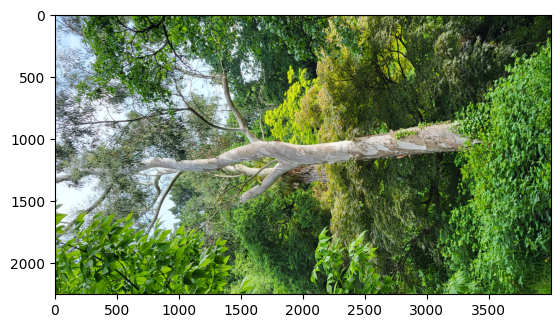

In [6]:
img = Image.open(images[0])
plt.imshow(img)

In this case the orientation is off as the image has been rotated a quarter turn anticlockwise. This shouldn't affect the models but is easy to fix.

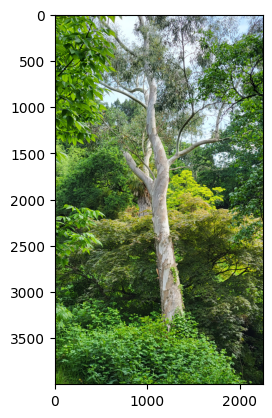

In [11]:
plt.imshow(img.transpose(Image.ROTATE_270))

Now that we have the basics of the image processing working, we need to talk about how the zero-shot classification works. The CLIP model used here is trained on a large dataset of image-text pairs and is trained to match images to the corresponding text. As a result, the model has some "understanding" of how visual features are linked to different words.

When we do the zero-shot classification, we first need to define some text labels for the objects we want to find. Then we let the model use its "understanding" of the relationships between the labels we provide and some key features in the images. Let's try a very simple case for `tree` and `car`.

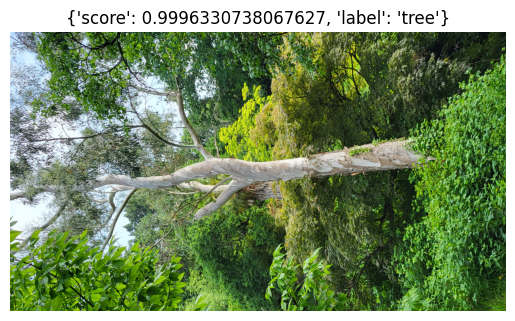

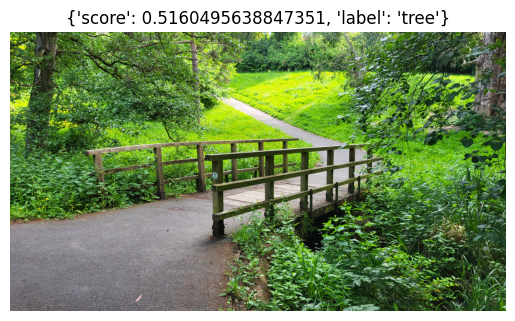

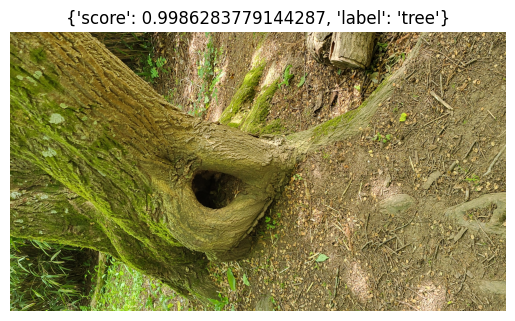

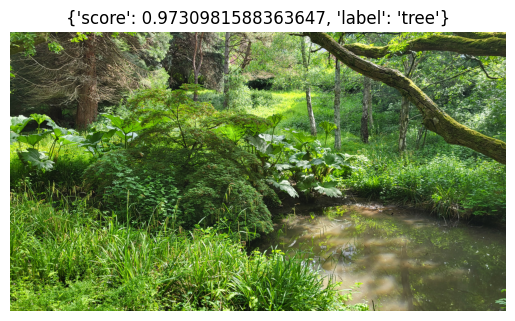

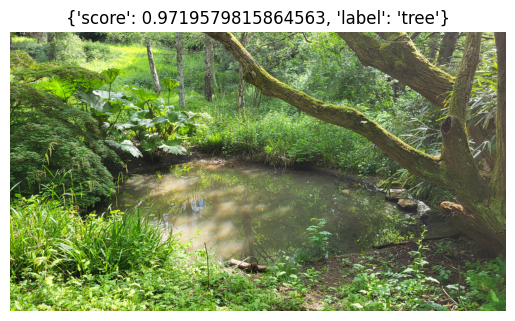

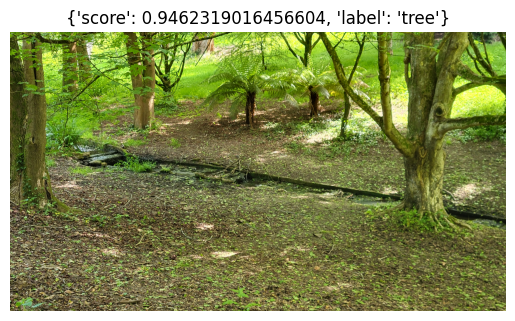

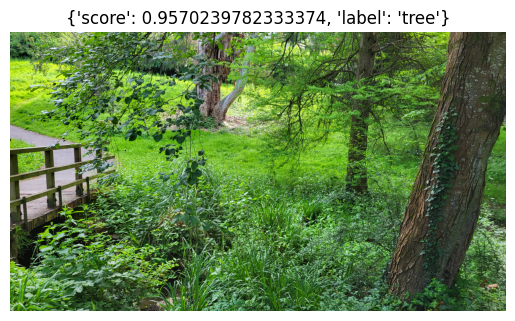

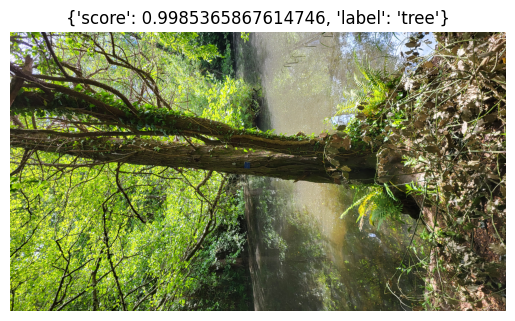

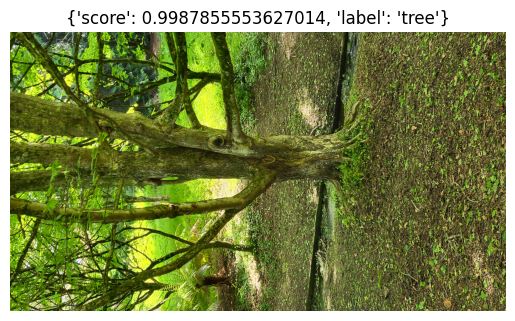

In [16]:
classes = ['tree','car']
predictions = classifier([Image.open(i) for i in images], candidate_labels=classes)

for img,pred in zip(images,predictions):
    plt.imshow(Image.open(img))
    plt.title(pred[0])
    plt.axis('off')
    plt.show()

Unsurprisingly, the model doesn't think there are any cars in the images, so it assigns each image a label of `tree`. This is an important lesson - the model will always assign one of the labels you provide, even if the ideal label is not present. Let's try again with some different labels, hear looking for the four key features in the various images: trees, a bridge, a pond and a stream.

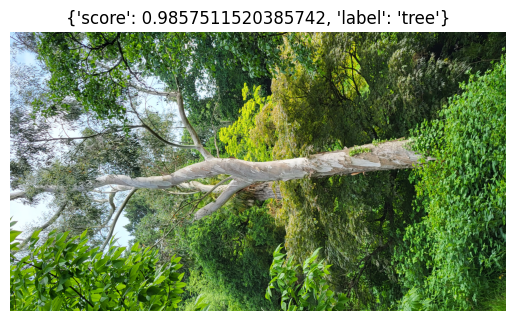

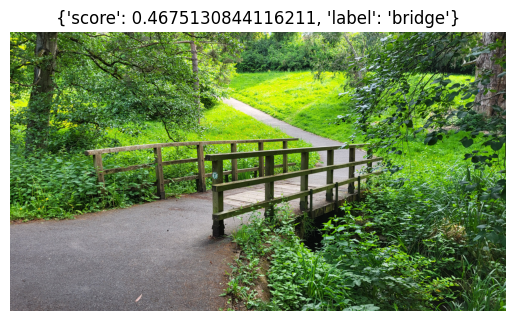

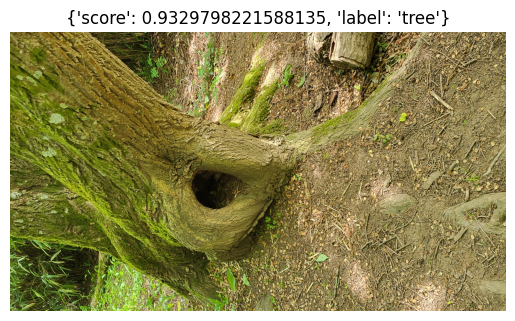

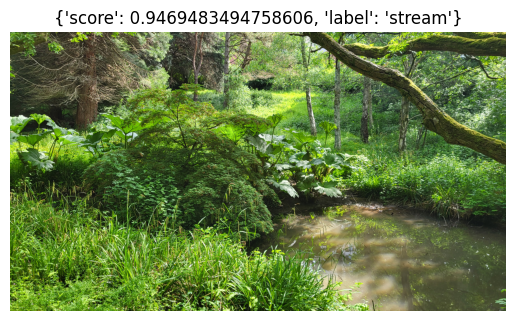

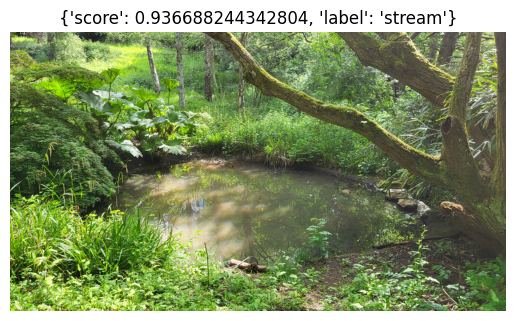

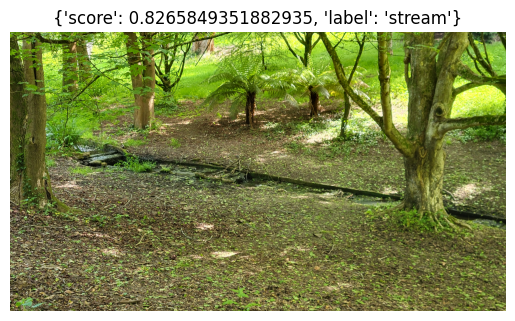

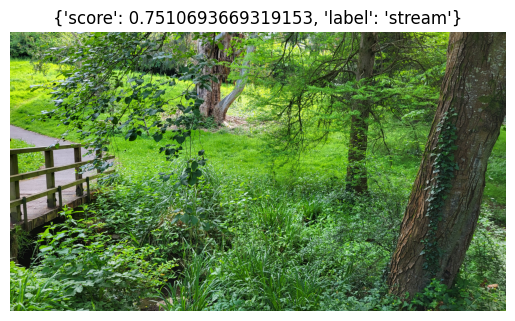

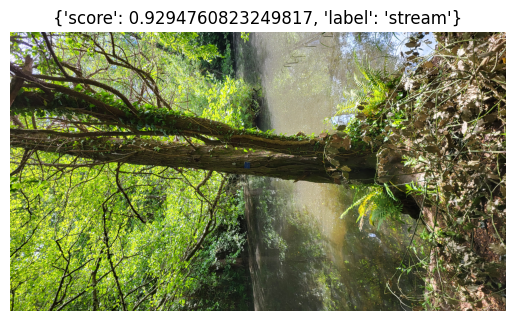

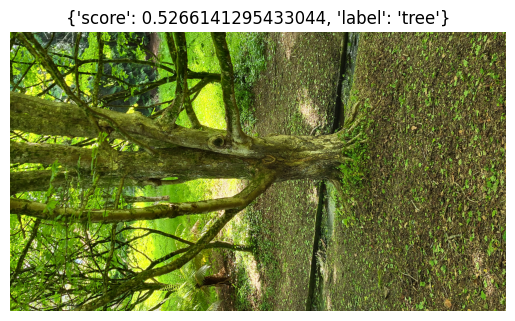

In [17]:
classes = ['tree','bridge','pond','stream']
predictions = classifier([Image.open(i) for i in images], candidate_labels=classes)

for img,pred in zip(images,predictions):
    plt.imshow(Image.open(img))
    plt.title(pred[0])
    plt.axis('off')
    plt.show()

The labels here are a little less successful. Nothing has been labelled as a `pond` as the model prefers `stream` in those cases. We could challenge the model again by looking for specific tree species.

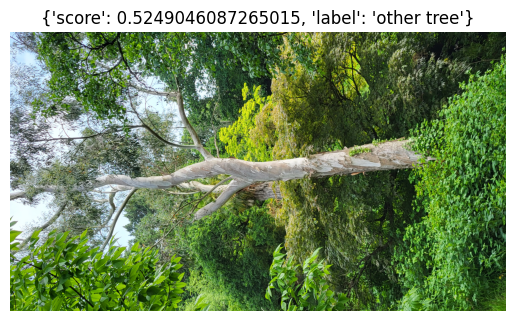

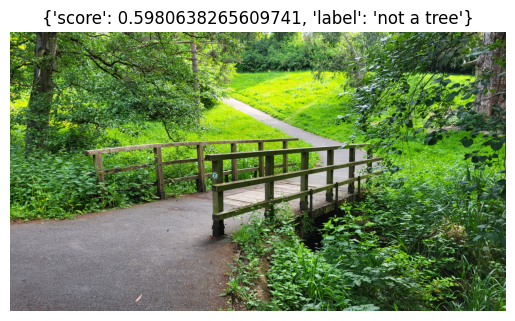

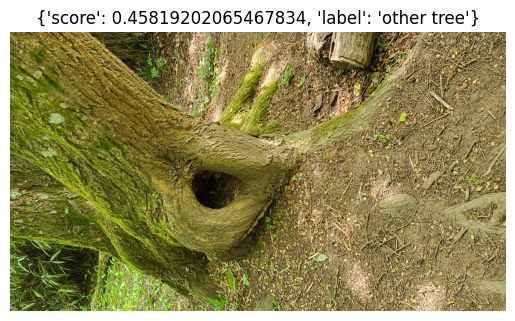

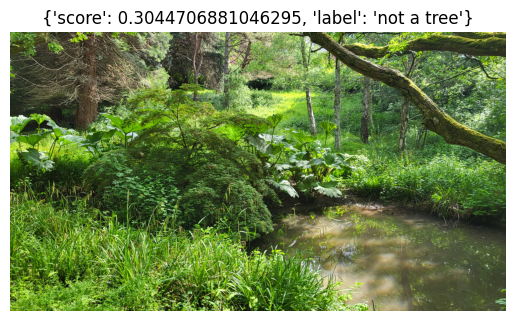

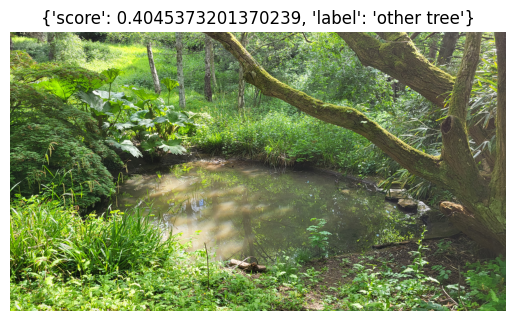

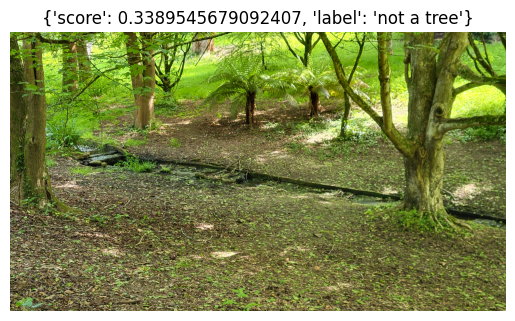

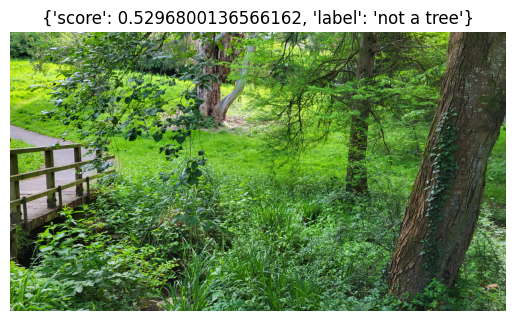

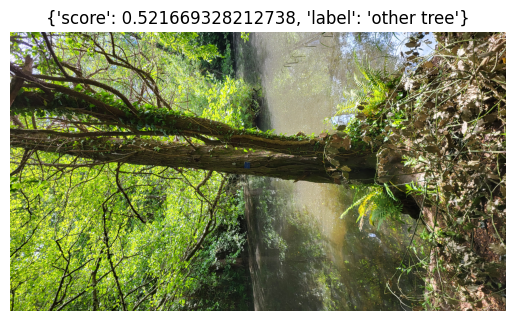

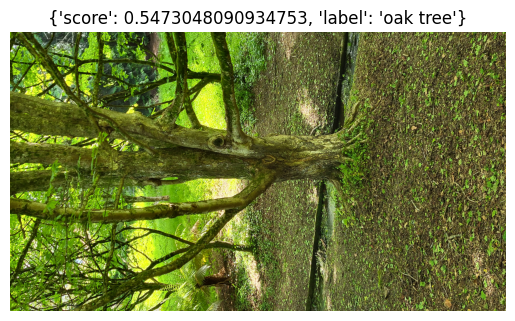

In [18]:
classes = ['birch tree','oak tree','other tree','not a tree']
predictions = classifier([Image.open(i) for i in images], candidate_labels=classes)

for img,pred in zip(images,predictions):
    plt.imshow(Image.open(img))
    plt.title(pred[0])
    plt.axis('off')
    plt.show()